# Data Mining / Prospecção de Dados

## Docente: Sara C. Madeira, 2019/20
## Aluno: Pedro Cotovio

# Project 3 - Classification/Regression

## Part 1 - EDA; Pre-Processing; Initial Analysis 

## Dataset and Tools

In this project you should use [Python 3](https://www.python.org), [Jupyter Notebook](http://jupyter.org) and **[Scikit-learn](http://scikit-learn.org/stable/). You are also allowed to use [Orange3](https://orange.biolab.si).**

The dataset to be analysed is **`ModifiedHousePrices.csv`**, a modified version of the train dataset used in Kaggle's competition ["House Prices: Advanced Regression Techniques"](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/overview). 

If you ask a home buyer to describe their dream house, they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence. With more than 70 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

**This project challenges you twice** by asking you to tackle a
1. **Regression Task**: predict the price, and a
2. **Classification Task**: predict a price category.

The variables are described [here](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data).

The targets are:
1. `SalePrice` - the property's sale price in dollars. This is the target variable that you're trying to predict in the regression task (same as in the Kaggle challenge).
2. `Price3Classes` - the price category, where price can be below 200000 ("<200000"), between 200000 and 400000 ("[200000,400000]"), or above 200000 (">200000"). This is the target variable that you're trying to predict in the classification task. 

# 1. Pre-Processing

In this notebook the original dataset will be analysed, pre-processed, and exported.

In [1]:
# Imports libraries
import pandas as pd
import os
from matplotlib import pyplot as plt
import numpy as np

from imblearn.combine import SMOTETomek
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')

import plotly.graph_objs as go
import plotly.io as pio
pio.templates.default = "gridon"
from plotly.subplots import make_subplots

# Import local modules

from pp_functions import *

#IPython Configs

%matplotlib inline
%load_ext autoreload
%autoreload 2

# Get data_path
path = get_path()

Using TensorFlow backend.


Path to Data: C:\Users\peped\OneDrive - Universidade de Lisboa\Ciencias de Dados\PD\PD_3_Classification\dataset


## EDA

In [2]:
# Load Dataset
df = pd.read_csv(os.path.join(path,"ModifiedHousePrices.csv"))
df.drop('Id', axis=1, inplace=True)
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Price3Classes
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,"[200000,400000]"
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,<200000
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,"[200000,400000]"
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,<200000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,"[200000,400000]"


In [5]:
# Dataset Profiling
profile(df)

In a real EDA, all features should be individually analysed and improved when possible. In this case, having in consideration the sheer size of the dataset, and the time-frame available this is not possible. So this problem will be treated has a big data problem and the dataset will be processed using a general pipeline, that might not be the optimal solution in every case but it's an acceptable solution, and the only possible solution in the time available to complete this assignment.  
Nevertheless, some attention was given to details, and checks were made to ensure the quality of all features retained.

It is important to also have in mind that classification and regression are two very different tasks, in a real scenario this would also need to be considered when performing feature engineering. For example, for classification having a mix of numerical and categorical variables will probably produce a worst result than binning all numerical variables. But for regression numerical features are very important.

## Reshape datasets

In [3]:
# Separate Features from targets
labels = ['SalePrice', 'Price3Classes']
targets = df[labels]
df.drop(labels, axis=1, inplace=True)

## Dealing with Zeros and Missing Values

In a real case scenario, most features with a poor quality could be improved using, different methods, like transformation into Boolean features. 

It is the case of the `Alley` feature for example, this feature indicates the type of alley entrance, but most houses do not have alleys, so there is a lot of missing data. This feature could be transformed to 0 or 1 (does not have alley, has alley), this could be useful to distinguish high level houses. But this features would probably not be selected in a feature selection process since it has low variation, must houses do not have alleys, and so this feature does not help to distinguish the 90%+ houses that don't have alleys.

For this reason, all features with **missing data or zeros on more than 80% of data points, will be discarded** since they do not provide a lot of information.

In case zeros or missing data total between 30% to 80% of a feature's cells, that feature will be transformed into a binary feature since this mainly happens for presence or not of a given characteristic.

### Zeros

In other cases, zeros can be maintained, since they don't add bias to the classifiers and some non-binary features need to be maintained to give discrimination power to the models.

### Missing values

* Numerical features, if no outliers are detected, then the mean is used, alternatively the median can be used.
* Categorical features, None as a string is used.

In the end it is verified if there exist any features where the same value represents 80% or more, of the total cells. This way features that will not improve discrimination between properties are eliminated. This step might be opted out, since this will affect classification of the minority class, (high end housing).

This pipeline ensures a good, and fast data pre-processing, although in some cases not optimal.

In [4]:
df, _del, cat_cols = feature_transform(df)
_del.head()

33 Deleted Features of 79


,Columns
0,Alley
1,BsmtFinSF2
2,LowQualFinSF
3,BsmtHalfBath
4,EnclosedPorch


Most deleted features could be transformed into binary features, and some might even be related to the target, but due to a low variance, in this dataset, would not help models to perform better.

## Encoding

Has was sad previously, numerical features are very important, most classification and regression models achieve better performance with this data type, with tree models being the exception

The combination of both numerical and categorical data normally leads to poor performance. So, it was implemented a pipeline able to transform this dataset into a continuous dataset, by means of a combination of techniques:

1. One-Hot Encoding of Categorical Features (by row)
2. Concatenate & Normalize Dataset
3. Generate Representations with Autoencoder

This pipeline generates continuous features, ensuring an uniform dataset, with low dimensionality (since autoencoders also serve has dimensionality reduction tools), and removed noise.

Of course, this type of dataset shifts models expected to perform better, to numerical based models like:

* Generalized Linear Models
* Support Vector Machines
* Multi-Layer Perceptron

In [5]:
X = encoder(df, cat_cols)
pd.DataFrame(X).head()

From 18 categorical features, 135 binary features generated
Total features 163


,0,1,2,3,4,5,6,7,8,9,...,153,154,155,156,157,158,159,160,161,162
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,1.198914,0.685778,-0.944591,...,0.823505,-0.114827,-0.253259,-0.078757,-0.600559,-0.24236,-0.56364,-0.24236,1.568348,-0.841191
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.834088,0.685778,-0.641228,...,0.823505,-0.114827,-0.253259,-0.078757,-0.600559,-0.24236,-0.56364,-0.24236,1.568348,-0.841191
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,1.198914,0.685778,-0.301643,...,0.823505,-0.114827,-0.253259,-0.078757,-0.600559,-0.24236,-0.56364,-0.24236,1.568348,-0.841191
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.834088,0.685778,-0.061670,...,-1.214321,-0.114827,-0.253259,-0.078757,1.665116,-0.24236,-0.56364,-0.24236,-0.637614,1.188791
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.198914,0.685778,-0.174865,...,0.823505,-0.114827,-0.253259,-0.078757,-0.600559,-0.24236,-0.56364,-0.24236,1.568348,-0.841191


In [6]:
# To train the NN
#X_encoded = generate_representation(X, train=True, encoding_dim=10, epochs=1000)

# Load Model from saved files
X_encoded = generate_representation(X, train=False)
pd.DataFrame(X_encoded).head()

Evaluation loss:  1.1315  (MSE)
10 Representations Generated from 163 Features


,0,1,2,3,4,5,6,7,8,9
0,3.499292,2.038329,0.427349,0.000000,0.000000,3.068699,0.000000,0.000000,0.0000,1.435542
1,0.000000,3.079073,0.182876,1.487855,1.875821,0.000000,0.000000,0.775207,0.0000,0.064467
2,3.600983,1.453849,0.641615,0.000000,0.000000,2.850393,0.000000,0.000000,0.0000,0.683739
3,0.000000,0.000000,0.699503,0.421736,0.386174,0.202081,1.957058,0.000000,3.4842,0.000000
4,5.290502,1.143490,0.000000,0.000000,0.000000,4.570058,0.423665,0.000000,0.0000,0.000000


In the end 10 features are going to be used. These features are representations of the original dataset. 

The loss is satisfactory, there is space for improvement, nevertheless. This could be done by increasing training time, and by some hyperparameter tuning.

# 2. Target Analisys

### Categorical Target

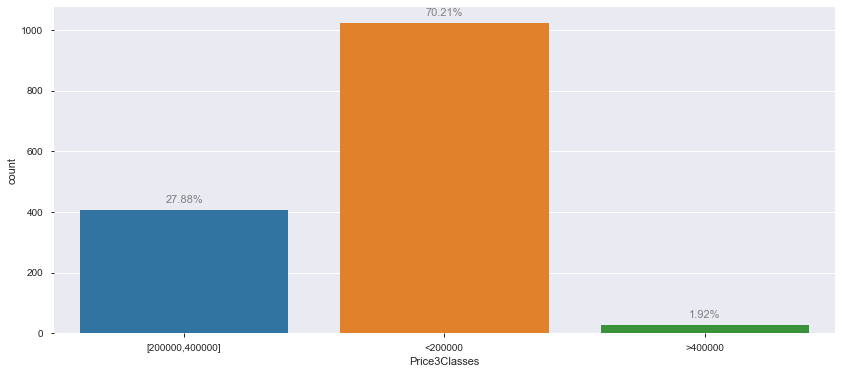

In [7]:
# Plot Target Again
make_bar_chart(targets['Price3Classes'])

There is a considerable difference between the classes. 

To solve this issue, a mixture of under sampling and over sampling:
1. `SMOTE` Function 
2. `Tomek Links` Function

The `SMOTE` function will generate new data points in the minority category, based on points that already existed in the dataset. Subsequently through the `Tomek Links` technique, the data is cleaned by removing near neighbors from different classes. This way, allowing models to discriminate classes better, since ambigous datapoints are removed.

Dataset has now 3047(+1587) datapoints.


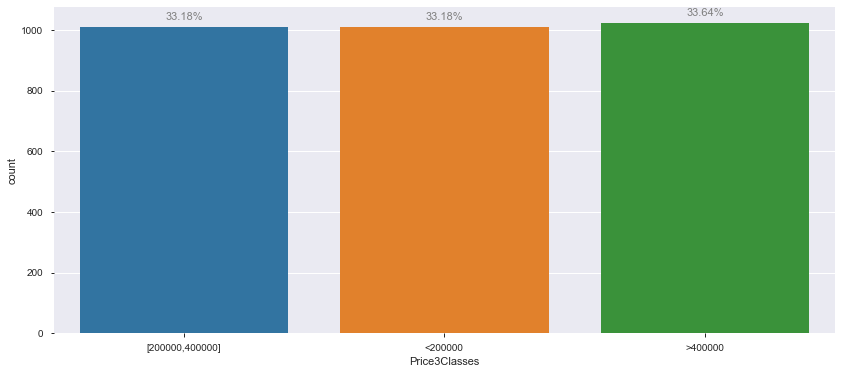

In [8]:
#Aplly under and over sampling
smt = SMOTETomek()
X_class, y_class = smt.fit_sample(X_encoded, targets['Price3Classes'])

# Plot Target Again

make_bar_chart(y_class)
print('Dataset has now {}(+{}) datapoints.'.format(len(X_class), len(X_class) - len(X_encoded)))

In [9]:
# Encode Target
le = LabelEncoder()
y_class = le.fit_transform(y_class)
set(y_class)

{0, 1, 2}

There was a big increase in datapoints (datapoints more than doubled), that will increase bias significatively.

### Continuous Target

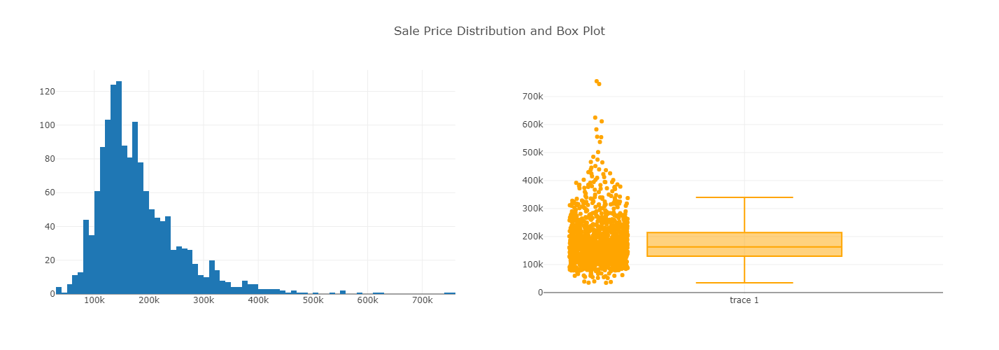

In [10]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Histogram(x=targets['SalePrice']),row=1,col=1)
fig.add_trace(go.Box(y=targets['SalePrice'],boxpoints='all',line_color='orange'),row=1,col=2)

fig.update_layout(height=500, showlegend=False,title_text="Sale Price Distribution and Box Plot")
fig.show()

In case plotly is not configured in your framework here is a snapshot.

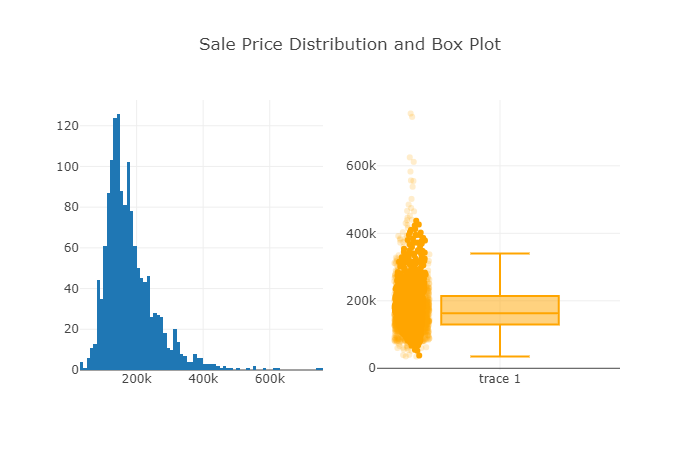

* The target is right skewed
* Most properties are priced below 400k, so it is normal our third class was so sparse.
* The class imbalance correction will have great impact on data in terms of bias and needs to be handled carefully.
* Probably the classes that are being used do not represent the market very well.

# 3. Export Datasets

In [11]:
# prepare dataframes
balanced_df = pd.DataFrame(X_class)
balanced_df['target'] = y_class
normal_df = pd.DataFrame(X_encoded)
normal_df['target'] = targets['SalePrice']

# export dataframes
balanced_df.to_csv(os.path.join(path,"balanced_df.csv"))
normal_df.to_csv(os.path.join(path,"normal_df.csv"))